In [1]:
import torch
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline, StableDiffusionInpaintPipelineLegacy, DDIMScheduler, AutoencoderKL
from PIL import Image

from ip_adapter import IPAdapterPlus

/home/santiagojn/anaconda3/envs/ipa/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
root_path = "/media/raid/santiagojn/IPAdapter/"

base_model_path = root_path + "Realistic_Vision_V4.0_noVAE"
# base_model_path = root_path + "stable-diffusion-v1-5"
vae_model_path = root_path + "sd-vae-ft-mse"
image_encoder_path = root_path + "models/image_encoder"
ip_ckpt = root_path + "models/ip-adapter-plus_sd15.bin"
# ip_ckpt = root_path + "results/test_train_serrano_plus2/checkpoint-210000/ip_adapter.bin"
device = "cuda"

In [4]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

noise_scheduler = DDIMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    clip_sample=False,
    set_alpha_to_one=False,
    steps_offset=1,
)
vae = AutoencoderKL.from_pretrained(vae_model_path).to(dtype=torch.float16)

In [5]:
# load SD pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    base_model_path,
    torch_dtype=torch.float16,
    scheduler=noise_scheduler,
    vae=vae,
    feature_extractor=None,
    safety_checker=None
)

Loading pipeline components...: 100%|██████████| 5/5 [00:00<00:00,  5.55it/s]


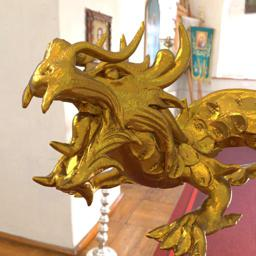

In [6]:
# read image prompt
image = Image.open("assets/images/dragon1.jpg")
image.resize((256, 256))

In [7]:
# load ip-adapter
ip_model = IPAdapterPlus(pipe, image_encoder_path, ip_ckpt, device, num_tokens=16)

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:06<00:00,  8.10it/s]


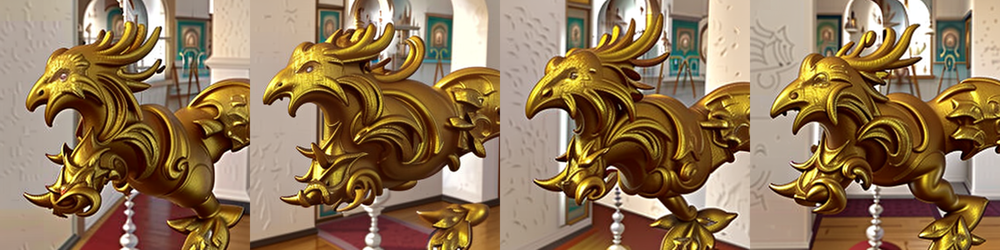

In [8]:
# only image prompt
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42)
grid = image_grid(images, 1, 4)
grid

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:05<00:00,  8.37it/s]


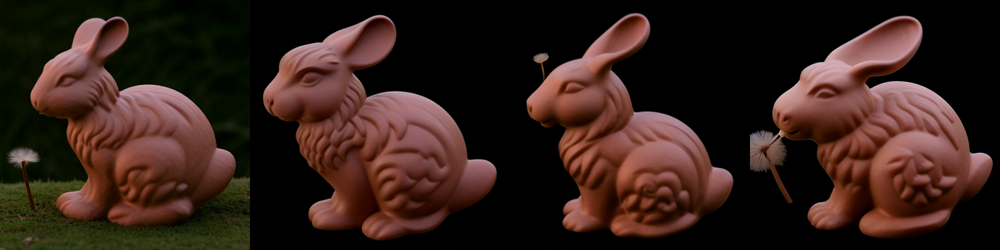

In [31]:
# multimodal prompts
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42,
        prompt="best quality, high quality, eating a dandelion in a mountain", scale=0.6)
grid = image_grid(images, 1, 4)
grid

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:05<00:00,  8.34it/s]


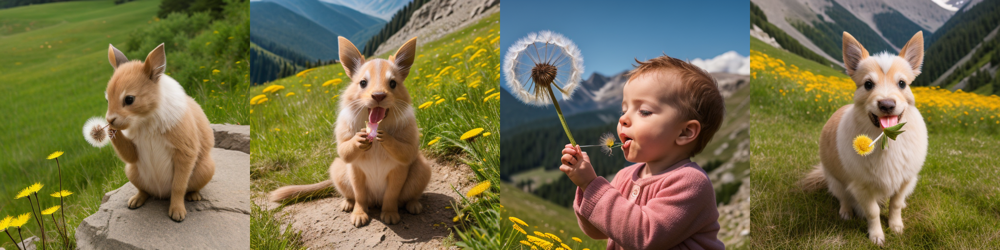

In [32]:
# multimodal prompts
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42,
        prompt="best quality, high quality, eating a dandelion in a mountain", scale=0.2)
grid = image_grid(images, 1, 4)
grid

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:06<00:00,  8.28it/s]


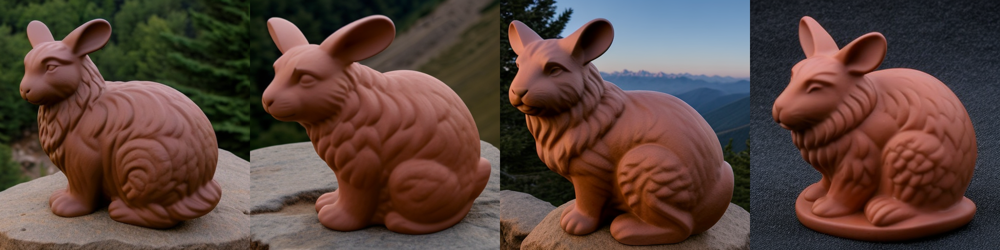

In [39]:
# multimodal prompts
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42,
        prompt="best quality, high quality, in a mountain", scale=0.4)
grid = image_grid(images, 1, 4)
grid

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:05<00:00,  8.44it/s]


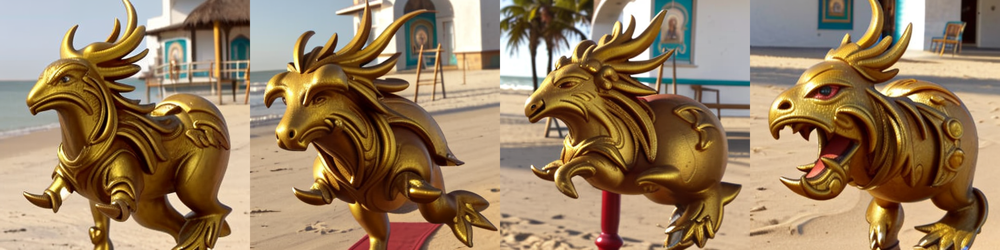

In [26]:
# multimodal prompts
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42,
        prompt="best quality, high quality, wearing a hat on the beach", scale=0.6)
grid = image_grid(images, 1, 4)
grid

Default IPAdapter generate, image_prompt_embeds: torch.Size([1, 16, 768])
Concatenating prompt_embeds_ with shape torch.Size([4, 77, 768]), and image_prompt_embeds with shape torch.Size([4, 16, 768])


100%|██████████| 50/50 [00:05<00:00,  8.38it/s]


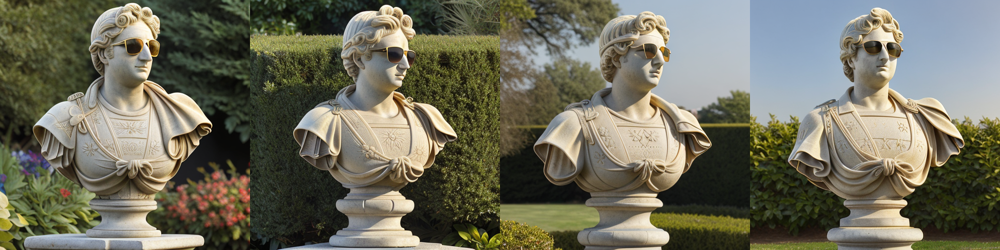

In [22]:
# multimodal prompts
images = ip_model.generate(pil_image=image, num_samples=4, num_inference_steps=50, seed=42,
        prompt="best quality, high quality, wearing sunglasses in a garden", scale=0.6)
grid = image_grid(images, 1, 4)
grid